In [1]:
# Libraries
import pandas as pd, seaborn as sns, pingouin as pg, matplotlib.pyplot as plt, pydeck as pdk
import plotly.express as px, numpy as np, re, ipywidgets as widgets, scipy.stats as stats
from sklearn.preprocessing import OneHotEncoder
from utils import MScore_to_int

# Credit Risk Analysis - Exloratory analysis<br>

The objective of this analysis is to understand which are the factors that are more effecting the probability of having an high credit risk of a given company, using initially only the data of the explanatory variables of previous year to predict the credit risk of the consequent one (true values vs forecasts). <br>
Then it can be added new explanatory variables 'delayed' e.g. leverage of two years, three years, (...) before. <br>
In this specific notebook the modified dataset will be imported and some very easy (but helpfull) exploratory analysis will be done.

**Financial Data Science (UniPV) - Prof. Paolo Giudici** <br>
*Computer Engineering (Data Science) - A.Y. 2022/23* <br>
*Francesco Amato, 507767*

### Import the dataset

In [2]:
# Load the datatset
companies_df = pd.read_csv('../datasets/cleaned-credit-risk.tar.gz', compression='gzip')
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,ROE.2018,ROE.2017,ROE.2016,ROE.2015,TAsset.2020,TAsset.2019,TAsset.2018,TAsset.2017,TAsset.2016,TAsset.2015
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,8.24,-146.65,60.76,-471.72,49263,28268,15455,15992,13597.0,11659.0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,61.42,-55.57,-127.29,-87.13,16550,16887,16468,10773,6697.0,8933.0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,57.52,42.73,20.34,44.62,13500,9620,7371,5432,4170.0,2862.0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,-17.24,0.71,2.89,6.45,24978,25032,25729,21632,25403.0,24941.0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,-5.17,-6.74,0.03,-8.19,36823,34659,36205,38423,41847.0,41323.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,11.01,8.44,7.83,6.31,15935,15664,14438,13054,12243.0,11695.0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,0.62,-4.80,-7.85,-12.84,2487,2317,2351,2521,2797.0,3152.0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,1.88,3.10,2.90,5.62,2547,1855,1692,1843,1773.0,1699.0
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,3.74,3.54,18.85,0.58,2961,2552,2604,2474,1546.0,1222.0


### Visualize companies by coordinates
#### Add to each row (representing a different company) the coordinate of the city

The objective is to obtain a graph that displays where the companies are located.<br>
Please **note** that since we do not have the precise address of the company we can just show an approximate location (a gaussian noise has been added to avoid that multiple companies overlap in the same exact geographical location).

In [3]:
countries_df = pd.read_csv('../datasets/countries.tar.gz', compression='gzip')[['name', 'alpha-2']]
cities_df = pd.read_csv('../datasets/world-cities.tar.gz', low_memory=False, compression='gzip')[['City', 'Country', 'Latitude', 'Longitude']]

In [4]:
countries_df['alpha-2'] = countries_df['alpha-2'].str.lower()
countries_df = countries_df.rename(columns={'name':'Country'})
countries_df

,Country,alpha-2
0,Afghanistan,af
1,Åland Islands,ax
2,Albania,al
3,Algeria,dz
4,American Samoa,as
...,...,...
244,Wallis and Futuna,wf
245,Western Sahara,eh
246,Yemen,ye
247,Zambia,zm


In [5]:
cities_df['City'] = cities_df['City'].str.capitalize()
cities_df = cities_df.rename(columns={'Country':'alpha-2'})
cities_df

,City,alpha-2,Latitude,Longitude
0,Aixas,ad,42.483333,1.466667
1,Aixirivali,ad,42.466667,1.500000
2,Aixirivall,ad,42.466667,1.500000
3,Aixirvall,ad,42.466667,1.500000
4,Aixovall,ad,42.466667,1.483333
...,...,...,...,...
3173953,Zimre park,zw,-17.866111,31.213611
3173954,Ziyakamanas,zw,-18.216667,27.950000
3173955,Zizalisari,zw,-17.758889,31.010556
3173956,Zuzumba,zw,-20.033333,27.933333


In [6]:
companies_locations_df = companies_df[['Company name', 'Region', 'Country']].merge(countries_df, on='Country')
companies_locations_df = companies_locations_df.rename(columns={'Region':'City'})
companies_locations_df = companies_locations_df .merge(cities_df, on=['City', 'alpha-2'])

In [7]:
# Add gaussian noise to locs (! location is 100% precise, but this is not our purpose !)
companies_locations_df['Latitude'] += np.random.normal(0, 0.03, len(companies_locations_df))
companies_locations_df['Longitude'] += np.random.normal(0, 0.03, len(companies_locations_df))

Select the visualization method, with the above widget (Hexagon Layer for better visualization)

In [8]:
visualize_widget = widgets.Select(options=['Density Mapbox', 'Hexagon Layer'], value='Density Mapbox', description='Map:', disabled=False)
visualize_widget

Select(description='Map:', options=('Density Mapbox', 'Hexagon Layer'), value='Density Mapbox')

In [9]:
if (visualize_widget.value == 'Density Mapbox'):
    fig = px.density_mapbox(companies_locations_df, lat='Latitude', lon='Longitude', radius=1.2, center=dict(lat=46.2, lon=8.2), zoom=3, mapbox_style='open-street-map', hover_name='Company name')
else: 
    layer = pdk.Layer(
    "HexagonLayer",
    companies_locations_df,
    get_position=["Longitude", "Latitude"],
    auto_highlight=True,
    elevation_scale=100,
    elevation_range=[0, 5000],
    pickable=True,
    extruded=True,
    coverage=3,
    )

    view_state = pdk.ViewState(
        longitude=7, latitude=43, zoom=4, pitch=40.5, bearing=-16,
    )
    fig = pdk.Deck(layers=[layer], initial_view_state=view_state)

fig.show()

### Details of companies for each country
#### Percentage of companies for each country

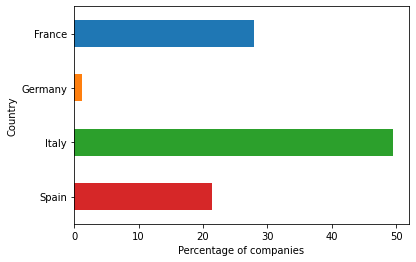

In [10]:
(companies_df.groupby('Country').size() / len(companies_df) * 100).plot(kind='barh', color=list(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])).invert_yaxis()
plt.xlabel('Percentage of companies');

#### Percentage of companies for each country, for each credit risk level (select the year through the slider)

In [11]:
year_widget = widgets.IntSlider(value=2020, min=2015, max=2020, description='Year:', disabled=False, continuous_update=True, orientation='horizontal', readout=True, readout_format='d')
year_widget

IntSlider(value=2020, description='Year:', max=2020, min=2015)

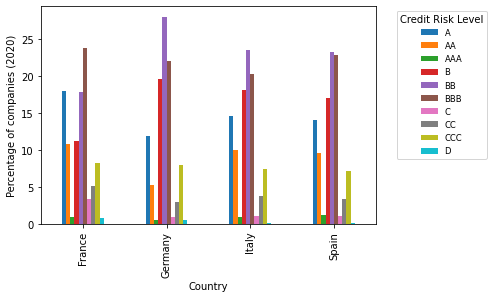

In [12]:
(companies_df.groupby(['Country', 'MScore.'+str(year_widget.value)]).size() / (companies_df.groupby(['Country']).size()) * 100).unstack().plot.bar()
plt.xlabel('Country')
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')')
plt.legend(title='Credit Risk Level', fontsize='small', fancybox=True, bbox_to_anchor=(1.05, 1.0), loc='upper left');

##### Casting MScore of the different years into integer values

In [13]:
for col in [c for c in companies_df.columns if c.startswith('MScore.')]:
    companies_df[str(col)+'.int'] = companies_df[str(col)].apply(lambda x: MScore_to_int(x))

##### Extra: companies have more an high or low credit risk (on average, on different years)?

In [14]:
low, high = [], [] 
for year in range(2015, 2021):
    low.append(companies_df['MScore.'+str(year)+'.int'].value_counts()[0])
    high.append(companies_df['MScore.'+str(year)+'.int'].value_counts()[1])
print('Average number of low level credit risk companies:', int(np.mean(low)))
print('Average number of high level credit risk companies:', int(np.mean(high)))

Average number of low level credit risk companies: 107824
Average number of high level credit risk companies: 13184


#### Percentage of companies - with low and high credit risk - for each country (in an year)

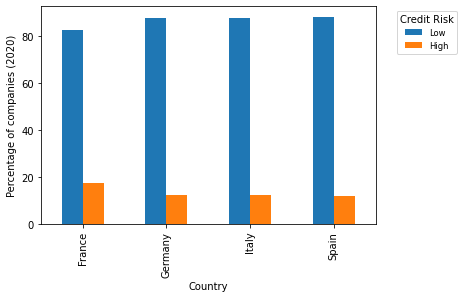

In [15]:
(companies_df.groupby(['Country', 'MScore.'+str(year_widget.value)+'.int']).size() / (companies_df.groupby(['Country']).size()) * 100).unstack().plot.bar()
plt.xlabel('Country')
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')')
plt.legend(['Low', 'High'], title='Credit Risk', fontsize='small', fancybox=True, bbox_to_anchor=(1.05, 1.0), loc='upper left');

By the graph illustrated before we can see that France is the country that is going worse

#### Percentage of companies with low and high level credit risk, for each city in a country (in an year)

In [16]:
(companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Country', 'Region']).size() / (companies_df.groupby(['Country','Region']).size()) * 100).unstack()

MScore.2020.int                          0          1
Country Region                                       
France  Ain                      88.418079  11.581921
        Aisne                    82.547170  17.452830
        Allier                   83.941606  16.058394
        Alpes-Maritimes          79.387755  20.612245
        Alpes-de-Haute-Provence  96.624473   3.375527
...                                    ...        ...
Spain   Valencia                 91.955307   8.044693
        Valladolid               90.909091   9.090909
        Vizcaya                  84.916865  15.083135
        Zamora                   95.454545   4.545455
        Zaragoza                 88.707654  11.292346

[584 rows x 2 columns]

### Details of companies for different years

#### Did Covid-19 led an increase in the number of high credit risk companies (considering the ones whe have)?

In [17]:
for year in range(2015, 2021):
    print(' High credit risk level companies in ' + str(year) + ': ' + str(companies_df['MScore.'+str(year)+'.int'].value_counts()[1]))

 High credit risk level companies in 2015: 14199
 High credit risk level companies in 2016: 12635
 High credit risk level companies in 2017: 11652
 High credit risk level companies in 2018: 11873
 High credit risk level companies in 2019: 12160
 High credit risk level companies in 2020: 16585


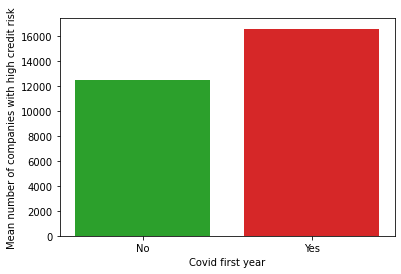

In [18]:
plt.bar([0,1], [np.mean(high[:-1]), high[-1]], color=list(['#2ca02c', '#d62728']))
plt.xlabel('Covid first year')
plt.xticks([0,1], ['No', 'Yes'])
plt.ylabel('Mean number of companies with high credit risk');

In [19]:
print('Percentage increase in high risk level companies in 2020 (with respect to past years): ' + str(round((high[-1] - np.mean(high[:-1])) / np.mean(high[:-1]) * 100, 1)) + '%')

Percentage increase in high risk level companies in 2020 (with respect to past years): 32.6%


Our hypothesis is true. <br>
Remember that **correlation is not causation!**<br>
Furthermore we should also take into consideration about the **effect size**<br>

### Details of companies for general sector

#### Percentage of companies for each general sector

In [20]:
(companies_df.groupby('Sector 2').size() / len(companies_df) * 100).to_frame()

,0
Sector 2,
Automobiles and Components,2.735356
Capital Goods,14.461854
Commercial and professional services,8.953953
Consumer Durables and Apparel,3.950978
Consumer Services,2.948565
Diversified Financials,0.666072
Energy,0.075202
Food Beverage and Tobacco,5.879777
Food and Staples Retailing,7.297038


#### Percentage of companies, in each country for each sector

In [21]:
(companies_df.groupby(['Country', 'Sector 2']).size() / (companies_df.groupby(['Country']).size()) * 100).to_frame()

0
Country Sector 2                                       
France  Automobiles and Components             1.778317
        Capital Goods                         14.395195
        Commercial and professional services  13.433542
        Consumer Durables and Apparel          1.600781
        Consumer Services                      3.373180
...                                                 ...
Spain   Software and Services                  1.664607
        Technology Hardware and Equipment      0.428704
        Telecommunication Services             0.266492
        Transportation                         6.936505
        Utilities                              1.602812

[83 rows x 1 columns]

#### Percentage of companies with low or high credit risk, for each sector  (in an year)

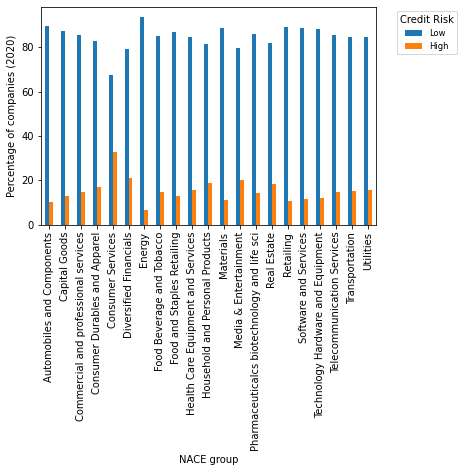

In [22]:
(companies_df.groupby(['MScore.'+str(year_widget.value)+'.int', 'Sector 2']).size() / (companies_df.groupby(['Sector 2']).size()) * 100).unstack('MScore.'+str(year_widget.value)+'.int').plot.bar();
plt.xlabel('NACE group')
plt.ylabel('Percentage of companies ('+str(year_widget.value)+')');
plt.legend(['Low', 'High'], title='Credit Risk', fontsize='small', fancybox=True, bbox_to_anchor=(1.05, 1.0), loc='upper left');

### Is it possible that after a company gets D credit risk level in an year and the consequent one still gets a D?

This check has been applied in order to understand whether the MScore represents a default or a credit risk level (they are not perfectly metching). Otherwise a company with level D should be closed in the consequent year/s.

In [23]:
year_widget = widgets.IntSlider(value=2019, min=2015, max=2019, description='Year:', disabled=False, continuous_update=True, orientation='horizontal', readout=True, readout_format='d')
year_widget

IntSlider(value=2019, description='Year:', max=2019, min=2015)

In [24]:
test_df = companies_df[companies_df['MScore.'+str(year_widget.value)] == companies_df['MScore.'+str(year_widget.value+1)]][['Company name', 'MScore.'+str(year_widget.value),  'MScore.'+str(year_widget.value+1)]]
n = test_df[test_df['MScore.'+str(year_widget.value)] == 'D'].count()[0]
print(str(n) + ' companies had a D credit risk level in ' + str(year_widget.value) + ' and the consequent year')

153 companies had a D credit risk level in 2019 and the consequent year


### One-hot encodings

#### Countries

In [25]:
encoder = OneHotEncoder()
encoder.fit(companies_df[['Country']])
encoder_df = pd.DataFrame(encoder.fit_transform(companies_df[['Country']]).toarray())
encoder_df.columns = [i[3:] for i in encoder.get_feature_names().tolist()]
companies_df = companies_df.join(encoder_df.iloc[:, -4:].apply(pd.to_numeric, downcast='integer'))
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,MScore.2020.int,MScore.2019.int,MScore.2018.int,MScore.2017.int,MScore.2016.int,MScore.2015.int,France,Germany,Italy,Spain
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,1,1,1,1,0,1,0,0,1,0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,0,0,0,1,1,1,0,0,1,0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,0,0,0,0,0,0,0,0,1,0
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,0,0,1,0,0,0,1,0,0,0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,0,0,1,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,0,0,0,0,0,0,0,0,1,0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,0,1,1,1,1,1,0,0,1,0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,0,0,0,0,0,0,0,0,0,1
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,0,0,0,0,0,1,0,0,1,0


#### General sectors

In [26]:
encoder.fit(companies_df[['Sector 2']])
encoder_df = pd.DataFrame(encoder.fit_transform(companies_df[['Sector 2']]).toarray())
encoder_df.columns = [i[3:] for i in encoder.get_feature_names().tolist()]
companies_df = companies_df.join(encoder_df.iloc[:, -21:].apply(pd.to_numeric, downcast='integer'))
companies_df

,Company name,Turnover.2020,Turnover.2019,Turnover.2018,Turnover.2017,Turnover.2016,Turnover.2015,EBIT.2020,EBIT.2019,EBIT.2018,...,Materials,Media & Entertainment,Pharmaceuticalcs biotechnology and life sci,Real Estate,Retailing,Software and Services,Technology Hardware and Equipment,Telecommunication Services,Transportation,Utilities
0,LENDLEASE S.R.L.,29458,16716,9612,8097,7941.0,5600.0,-1556.0,-4540.0,623.0,...,0,0,0,0,0,0,0,0,0,0
1,PRICEWATERHOUSECOOPERS BUSINESS SERVICES SRL (...,16731,16403,16843,12241,9252.0,9515.0,1838.0,841.0,2738.0,...,0,0,0,0,0,0,0,0,0,0
2,EVISO S.P.A.,48568,43039,34302,25791,19760.0,6941.0,1661.0,1464.0,976.0,...,0,0,0,0,0,0,0,0,0,1
3,CASA SERVICE MACHINE,47999,43484,43043,41682,51267.0,52584.0,416.0,255.0,-855.0,...,0,0,0,0,1,0,0,0,0,0
4,PANFERTIL SPA,45948,47336,45626,48222,57074.0,62263.0,44.0,713.0,-672.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121003,ASTOR VILLAGE S.R.L.,3161,4635,4742,4499,4277.0,3650.0,985.0,1818.0,1790.0,...,0,0,0,0,0,0,0,0,0,0
121004,ODONE & SLOA S.R.L.,3161,2562,2559,2334,3692.0,2537.0,60.0,101.0,27.0,...,0,0,0,0,0,0,0,0,0,0
121005,GARRIDO MURO SOCIEDAD LIMITADA,3161,3146,2989,3101,2746.0,3154.0,260.0,13.0,48.0,...,0,0,0,0,0,0,0,0,0,0
121006,CENTRO INGROSSO JOLLY S.R.L.,3161,2519,2290,2244,1761.0,1821.0,74.0,48.0,60.0,...,0,0,0,0,1,0,0,0,0,0


### Correlations and partial correlations

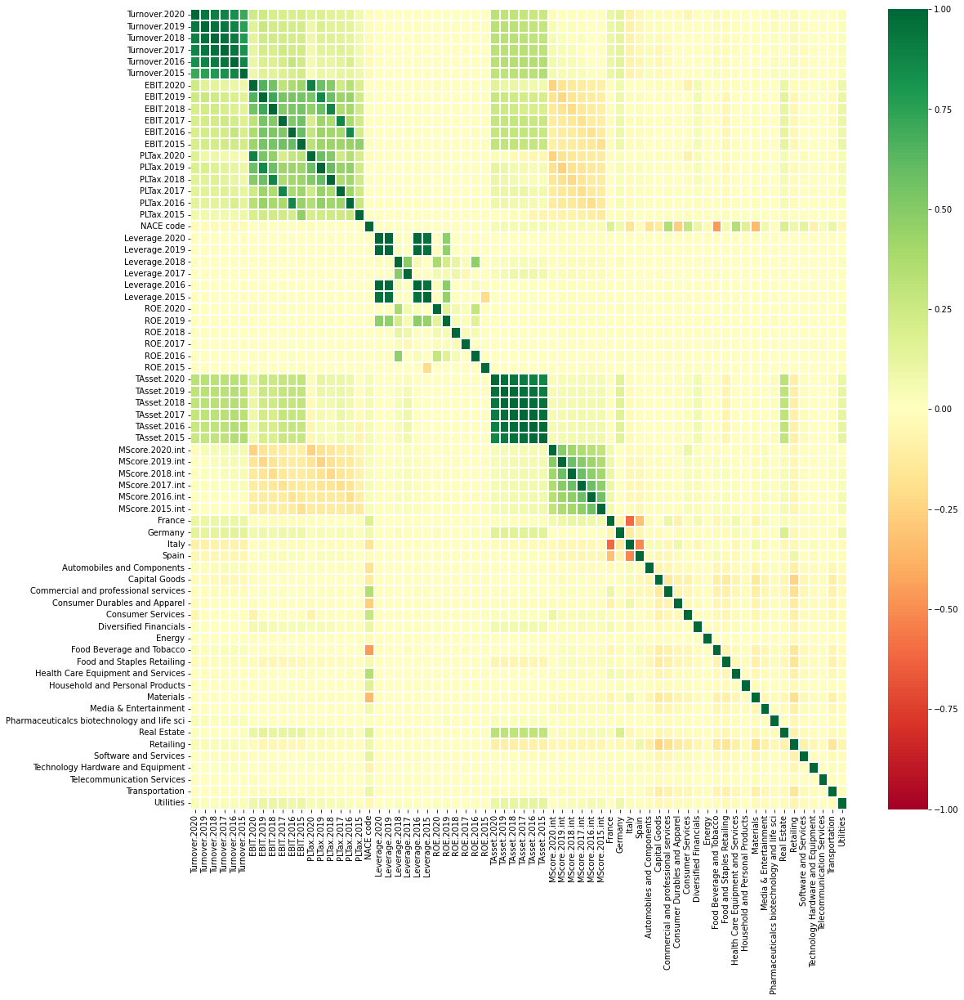

In [27]:
# Pearson correlation
plt.figure(figsize=(18, 18))
sns.heatmap(companies_df.corr(), cmap='RdYlGn', linewidths = 0.1, vmin=-1, vmax=1);

Always recall of the presence of spurious correlations

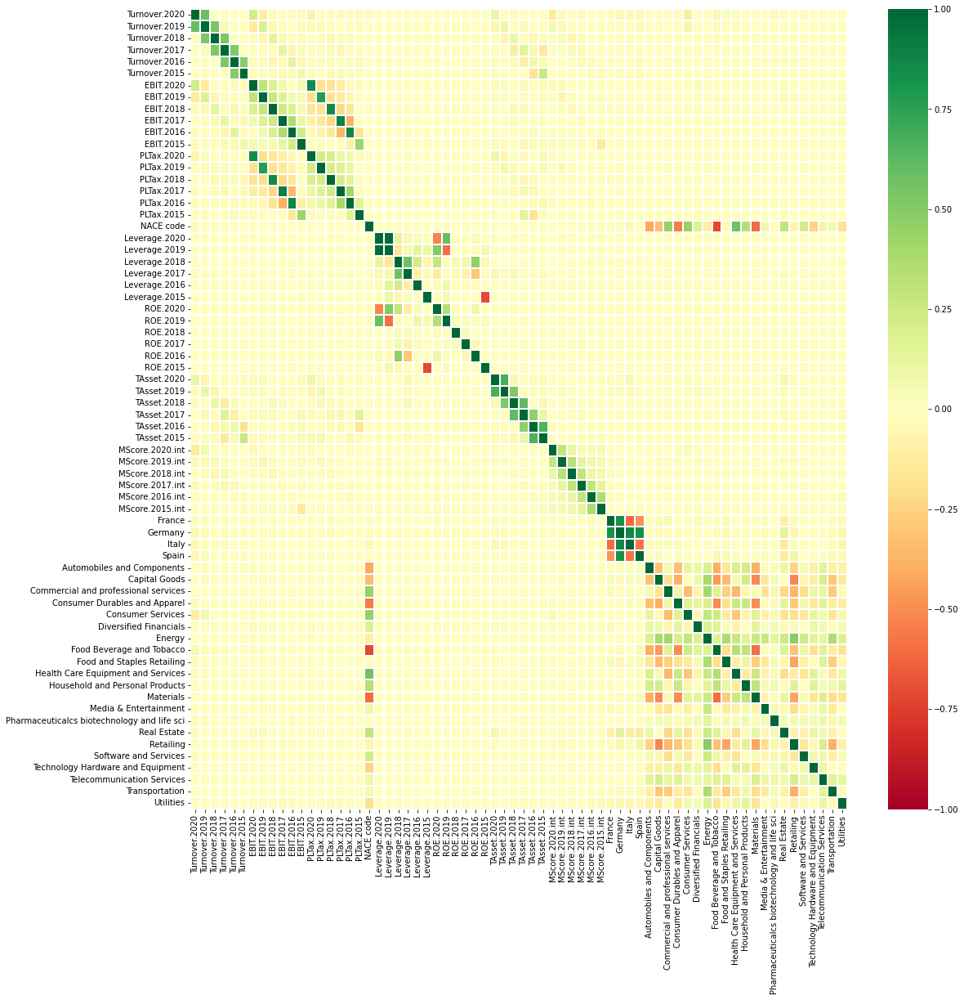

In [28]:
# Partial correlations
plt.figure(figsize=(18, 18))
sns.heatmap(pg.pcorr(companies_df), cmap='RdYlGn', linewidths = 0.1, vmin=-1, vmax=1);

Since our target variable is the MScore (in an year), basically we want to consider which are the variables that are more impacting the response varible (without taking into account possible spurious correlations with the features we are considering). <br>
It is clear that the MScore in an year is positively correlated with previous years MScores (the correlation strength reduces with years). It basically means that if a company has an high credit risk level in an year it is highly possible that the same will happen in the following year (and also - but with less strength effect - also in the consequent ones). <br>Furthermore if we have the Turnover and the EBIT features in the same year, negative values of those two will cause an increase in the credit risk level.

### Store the obtained dataset (with one hot encodings)

In [29]:
companies_df.to_csv('../datasets/one-hot-credit-risk.tar.gz', index=False)